<a href="https://colab.research.google.com/github/ipeirotis/dealing_with_data/blob/master/06-Spatial_Data_and_Maps/A-Plotting_Spatial_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Pandas: Plotting

## Preliminaries and Setup

In [2]:
!sudo apt-get install -y -qq  libgeos-dev libproj-dev proj-data proj-bin libgdal-dev libspatialindex-dev 
!sudo pip install -U -q shapely rtree pygeos geopandas descartes PyMySQL sqlalchemy sql_magic xlrd

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 4.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package libspatialindex4v5:amd64.
(Reading database ... 155639 files and directories currently installed.)
Preparing to unpack .../libspatialindex4v5_1.8.5-5_amd64.deb ...
Unpacking libspatialindex4v5:amd64 (1.8.5-5) ...
Selecting previously unselected package libspatialindex-c4v5:amd64.
Preparing to unpack .../libspatialindex-c4v5_1.8.5-5_amd64.deb ...
Unpacking libspatialindex-c4v5:amd64 (1.8.5-5) ...
Selecting previously unselected package libspatialindex-dev:amd64.
Preparing to unpack .../libspatialindex-dev_1

In [3]:
# Render our plots inline
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import os
from sqlalchemy import create_engine

sns.set_style("whitegrid")
sns.set(rc={'figure.figsize': (20, 20)})
matplotlib.style.use(['seaborn-talk', 'seaborn-ticks'])

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


## Using plotting for data analysis

We will be visualizing the [NYPD Vehicle Collissions](https://data.cityofnewyork.us/Public-Safety/NYPD-Motor-Vehicle-Collisions/h9gi-nx95/data) data set. 

In [4]:
#@title Load collisions dataset
conn_string = 'mysql+pymysql://{user}:{password}@{host}/{db}?charset=utf8mb4'.format(
    host = 'db.ipeirotis.org', 
    user = 'student',
    password = 'dwdstudent2015', 
    db = 'collisions',
    encoding = 'utf8mb4')

mysql_conn = create_engine(conn_string).connect()

# This query returns back the collisions table
sql = '''
	SELECT * 
  FROM collisions
'''
df = pd.read_sql(sql, con=mysql_conn)
df

,UNIQUE_KEY,DATE_TIME,LATITUDE,LONGITUDE,ZIPCODE,NEIGHBORHOOD,BOROUGH,PERSONS_INJURED,PERSONS_KILLED,PEDESTRIANS_INJURED,PEDESTRIANS_KILLED,CYCLISTS_INJURED,CYCLISTS_KILLED,MOTORISTS_INJURED,MOTORISTS_KILLED,ON_STREET_NAME,CROSS_STREET_NAME,OFF_STREET_NAME,REPORTED_ZIPCODE,REPORTED_BOROUGH
0,0000022,2012-07-01 10:40:00,40.720854,-74.003929,10013,SoHo-TriBeCa-Civic Center-Little Italy,Manhattan,0,0,0,0,0,0,0,0,CANAL STREET,WOOSTER STREET,None,10013,MANHATTAN
1,0000023,2012-07-01 12:18:00,40.704799,-74.016685,10280,park-cemetery-etc-Manhattan,Manhattan,0,0,0,0,0,0,0,0,BATTERY PLACE,WEST STREET,None,10004,MANHATTAN
2,0000024,2012-07-01 15:00:00,NaN,NaN,None,None,None,0,0,0,0,0,0,0,0,WATER STREET,OLD SLIP,None,None,None
3,0000025,2012-07-01 18:00:00,40.713692,-74.013754,10007,SoHo-TriBeCa-Civic Center-Little Italy,Manhattan,0,0,0,0,0,0,0,0,WEST STREET,VESEY STREET,None,10007,MANHATTAN
4,0000026,2012-07-01 19:30:00,40.719058,-74.012442,10013,SoHo-TriBeCa-Civic Center-Little Italy,Manhattan,0,0,0,0,0,0,0,0,WEST STREET,HARRISON STREET,None,10013,MANHATTAN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1882900,4537408,2022-06-09 09:30:00,NaN,NaN,None,None,None,0,0,0,0,0,0,0,0,None,None,2315 STRAUSS STREET,11212,BROOKLYN
1882901,4537409,2022-06-09 16:27:00,40.670660,-73.904205,11212,Brownsville,Brooklyn,0,0,0,0,0,0,0,0,PITKIN AVENUE,POWELL STREET,None,11212,BROOKLYN
1882902,4537412,2022-06-11 22:25:00,40.663670,-73.912130,11212,Brownsville,Brooklyn,3,0,0,0,0,0,3,0,DUMONT AVENUE,BOYLAND STREET,None,11212,BROOKLYN
1882903,4537413,2022-06-06 00:00:00,40.655148,-73.910940,11212,Rugby-Remsen Village,Brooklyn,0,0,0,0,0,0,0,0,None,None,601 AMBOY STREET,11212,BROOKLYN


We define a couple of auxiliary columns:

In [5]:
df['INJURY'] = (df['PERSONS_INJURED']>0)
df['DEATH'] = (df['PERSONS_KILLED']>0)

## Overplotting

In our last exercise, we finished by creating a scatterplot of the accidents.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


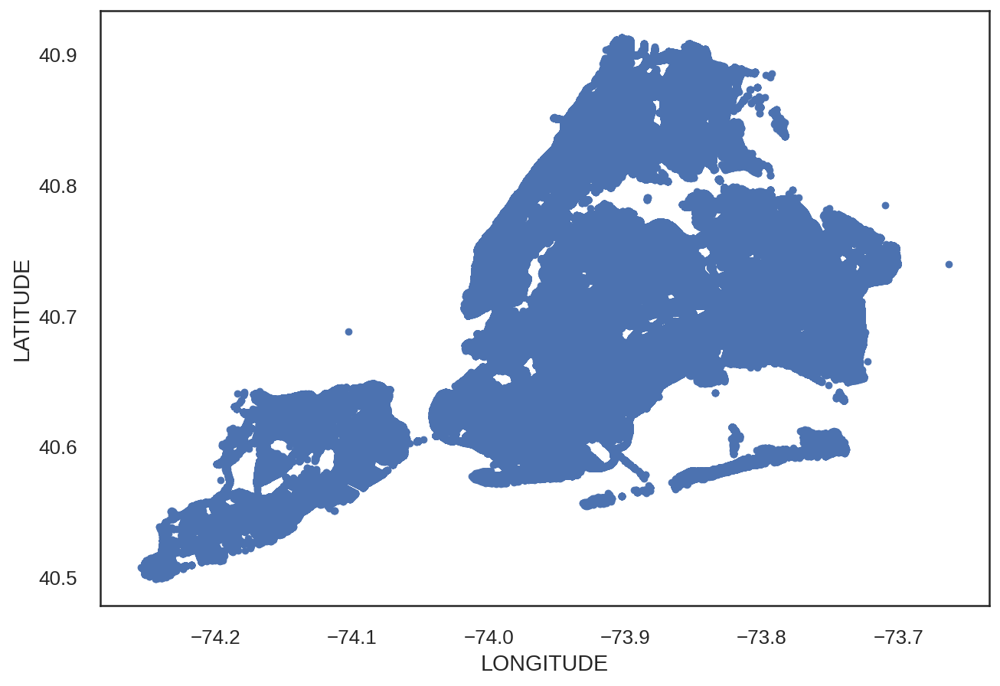

In [6]:
df.plot(kind='scatter', x='LONGITUDE', y='LATITUDE')

## Addressing Overplotting


The picture above is showing us that accidents happen in all places in NYC, except maybe some areas of Staten Island. But we have so many data points (~1 million), that we cannot tell anything more beyond that. This is called **overplotting**. The issue becomes increasingly common with the emergence of even medium-sized datasets, such as this one.

Below, we are doing to examine a set of techniques for addressing the issue.

### Sampling

One solution, that is commonly used when we have too many data points, is to simply take a subset of the data. Below, by keeping just 1% of the dataset, we can get a feeling of the density if the accidents in Manhattan, especially around midtown.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


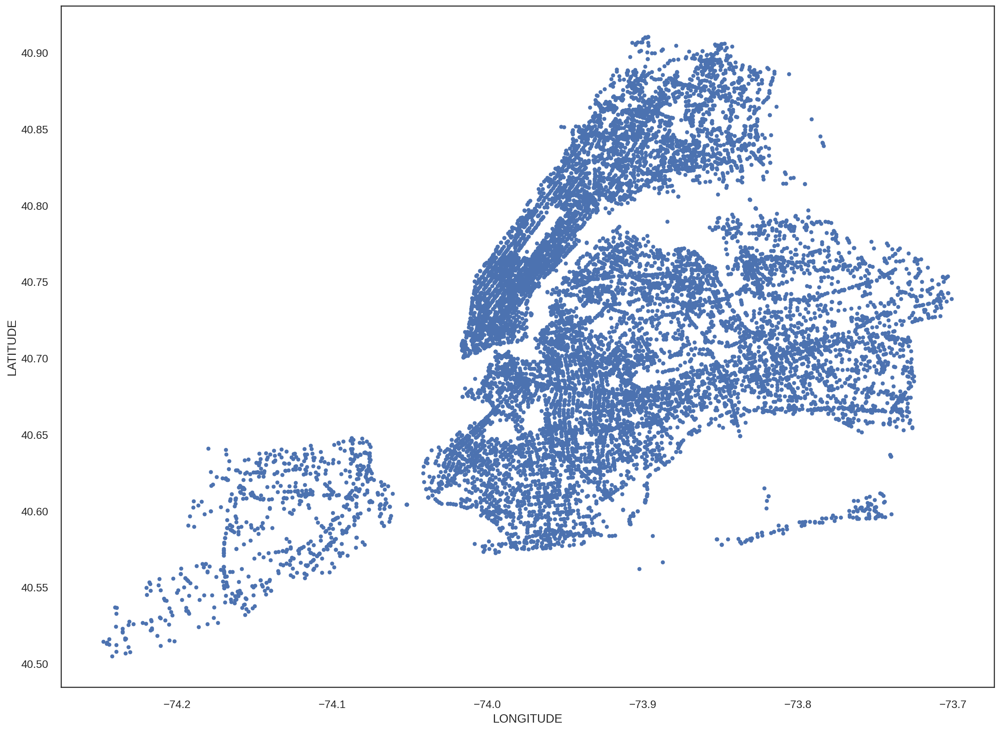

In [7]:
# We can either specify the number of data points,
# or the percentage of the dataset that we want to keep.

# Keep 10,000 data points
# sample = cleandf.sample(n=10000)

# Keep 1% of the dataset
sample = df.sample(frac=0.01)

sample.plot(kind='scatter', x='LONGITUDE', y='LATITUDE', figsize=(20, 15))

### Changing marker size

Another technique that we can use is to reduce the market size. By default, in Pandas, the marker size for scatterplots is 5 pixels. We can reduce it to 1 pixel by setting `s=1`, or even smaller, eg., `s=0.5`. With this setting, we start seeting that there is a higher density of accidents among major highways. 

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


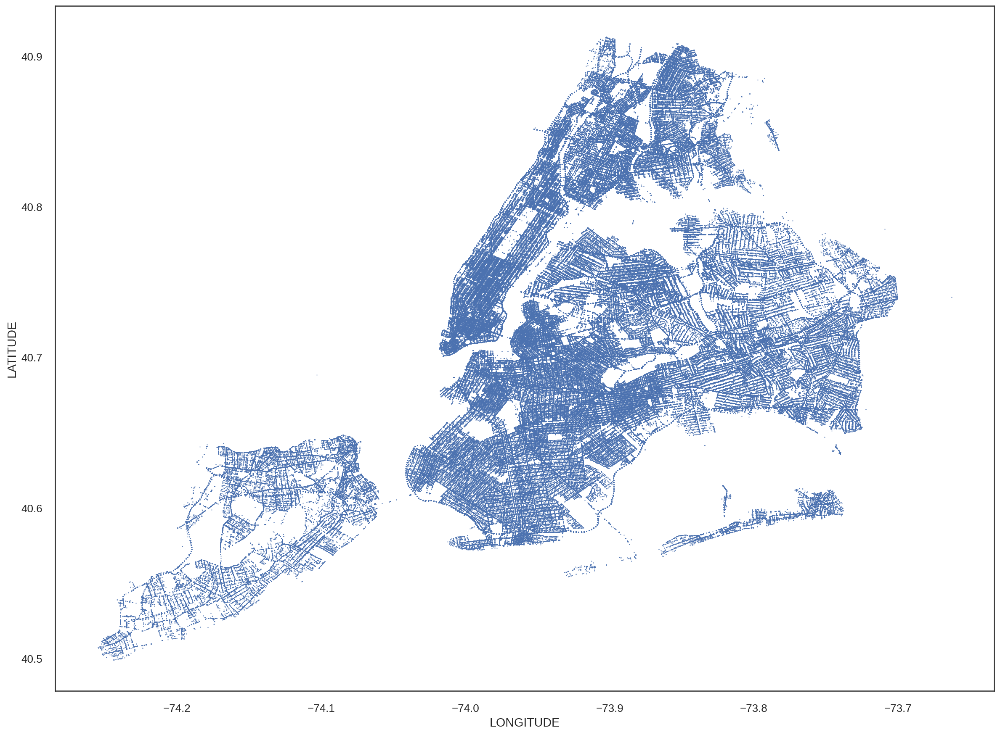

In [8]:
df.plot(
    kind='scatter', x='LONGITUDE', y='LATITUDE', figsize=(20, 15), s=0.5 )

### Changing Marker Transparency

Another common technique is to change the  transparency of the  markers. Using semi-transparent markers we can then optically separate areas where there are many points (the area will still look densely plotted), from areas where there are only a few markers. We can set the transparency using the `alpha` parameter. Setting `alpha=1` means no transparency, while `alpha=0` is full transparency.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


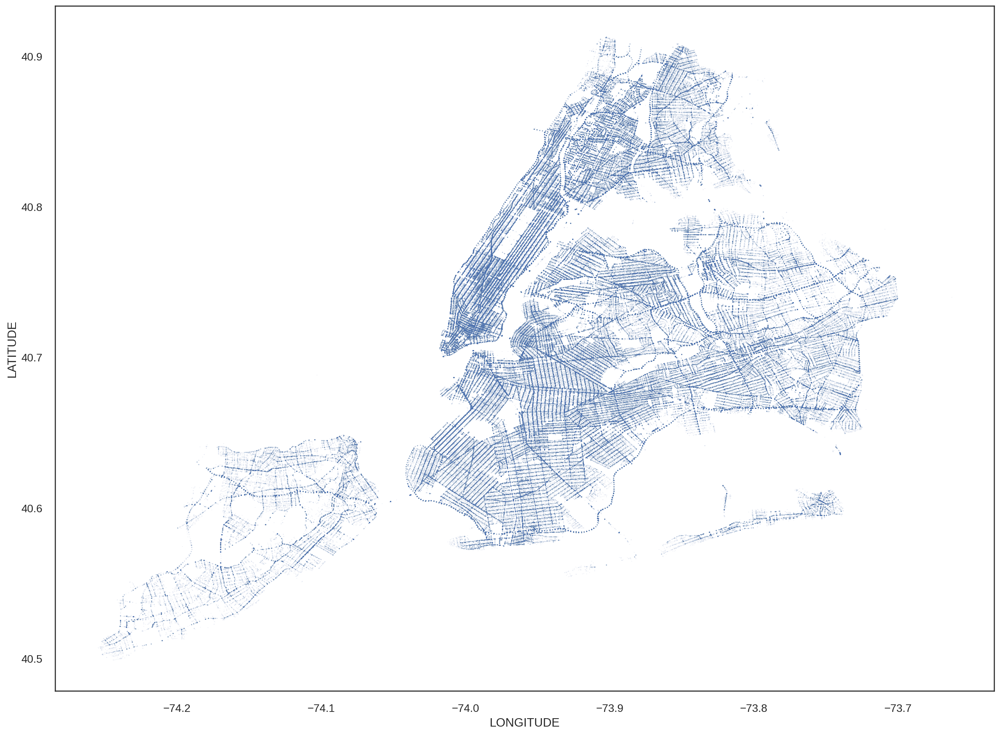

In [9]:
df.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.05)

### Creating 2d histograms, density plots, and contour plots


In the picture above, we can visually see that Manhattan, especially eastern midtown, and the area downtown near the entrance to the bridges, has a higher density. We can actually directly histograms and density plots on 2-dimensions.

#### 2d histograms: Grid and Hexagonal bin plots



The hexbin plot created a 2-d histogram, where the color signals the number of points within a particular area. The `gridsize` parameter chooses the size of each bin. Higher values offer higher granularity, but very high values tend to create sparsity, when we do not have enough data points.

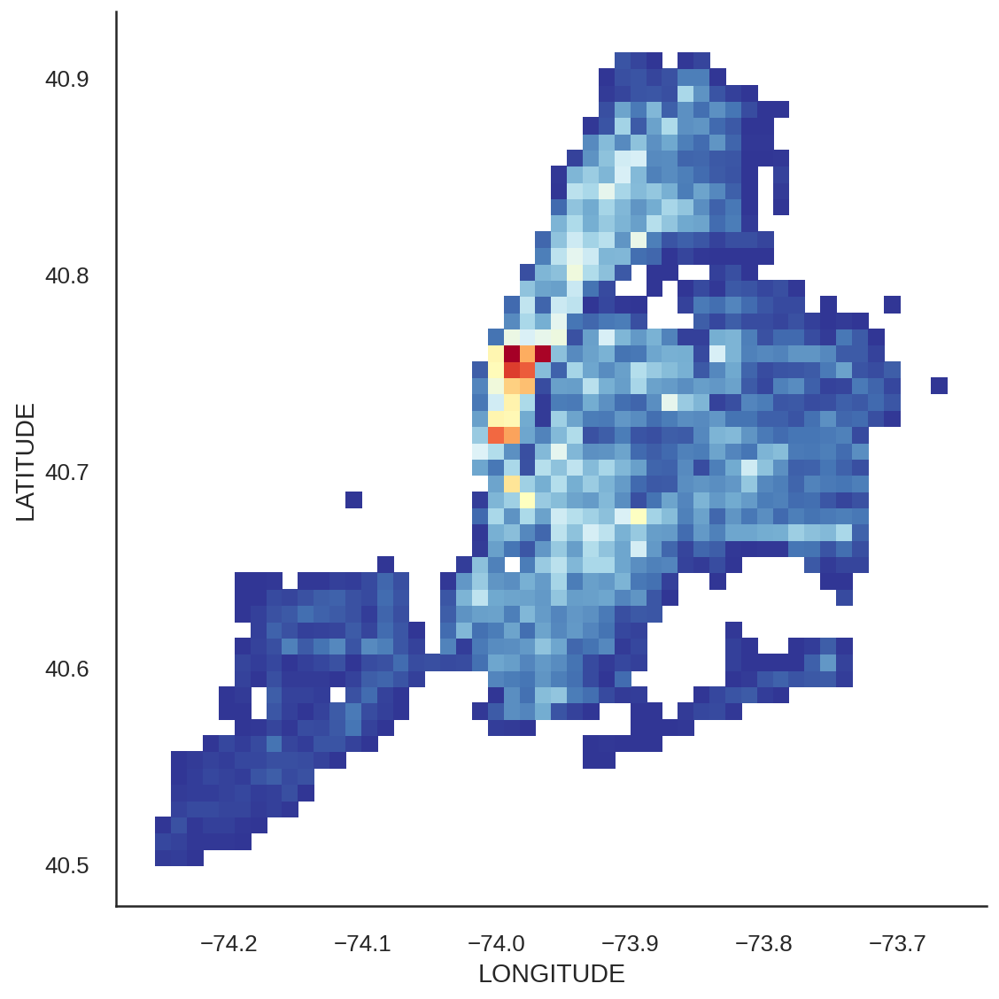

In [32]:
# 2d plot
sns.displot(
    data=df,
    kind='hist',
    x='LONGITUDE',
    y='LATITUDE',
    bins=50,
    cmap='RdYlBu_r',
    height=8, aspect=1)

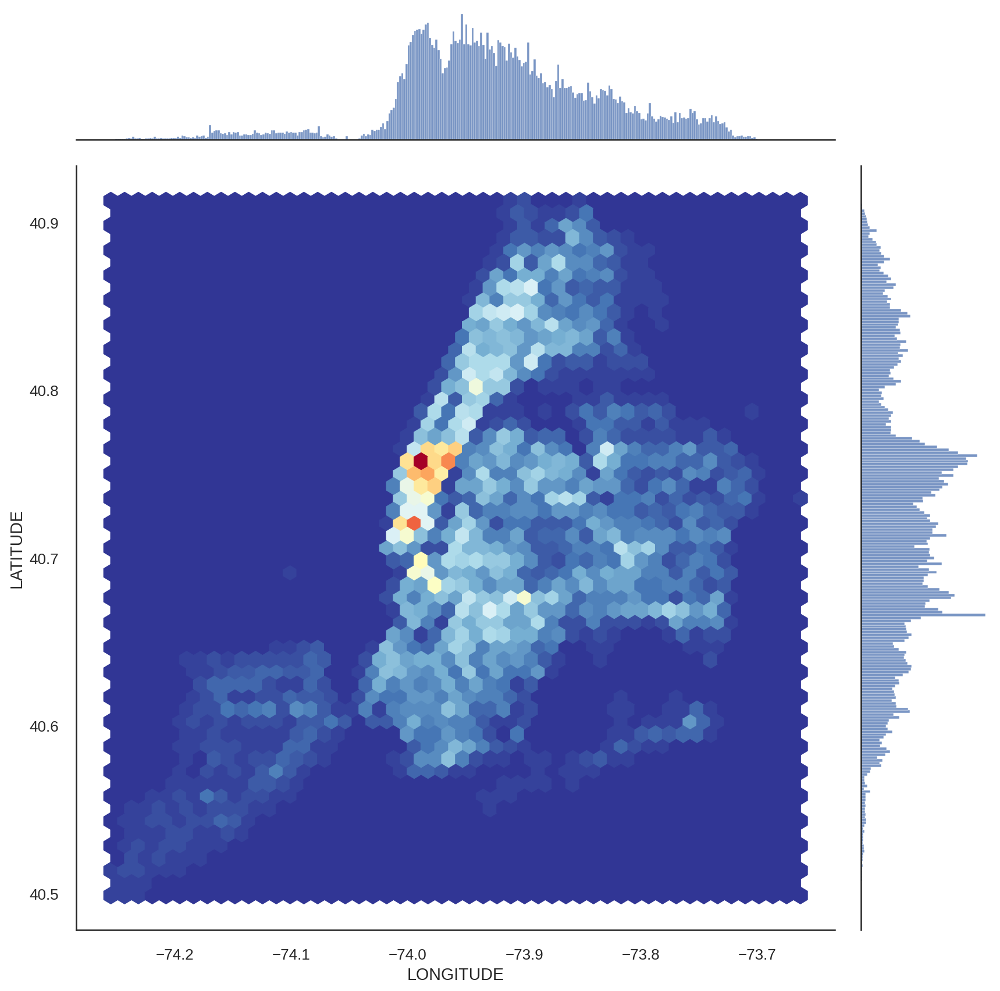

In [31]:
# Hexbin plot
sns.jointplot(
    data=df,
    kind='hex',
    x='LONGITUDE',
    y='LATITUDE',
    bins=50,
    cmap='RdYlBu_r',
    dropna=True,
    height=12
  )

#### 2d density  and contour plots


An alternative to the hexbin plots is to use density plots in two dimensions.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:1213: UserWarning: The following kwargs were not used by contour: 'height'
  **contour_kws,


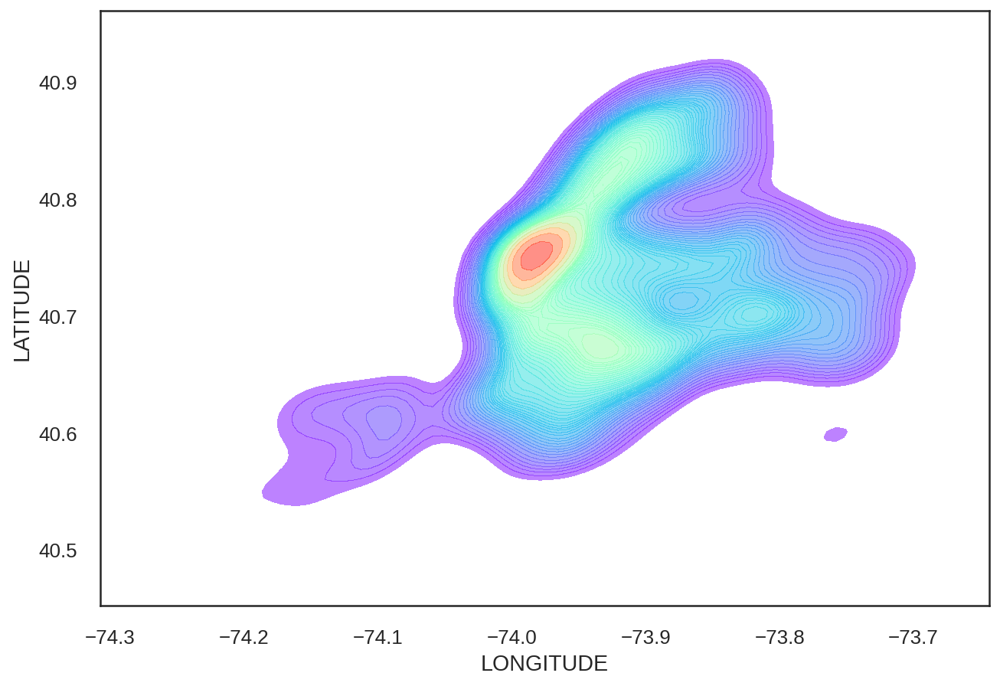

In [40]:
# We take a sample, because density plots take a long time to compute
# and a sample is typically as good as the full dataset
sample = df.sample(10000)

sns.kdeplot(
    data=sample,
    x='LONGITUDE',
    y='LATITUDE',
    gridsize=100,  # controls the resolution
    cmap='rainbow',  # color scheme
    shade= True, # whether to have a density plot (True), or just the contours (False)
    alpha=0.5,
    thresh=0.05,
    n_levels=50,  # How many contours/levels to have
    height = 10
)

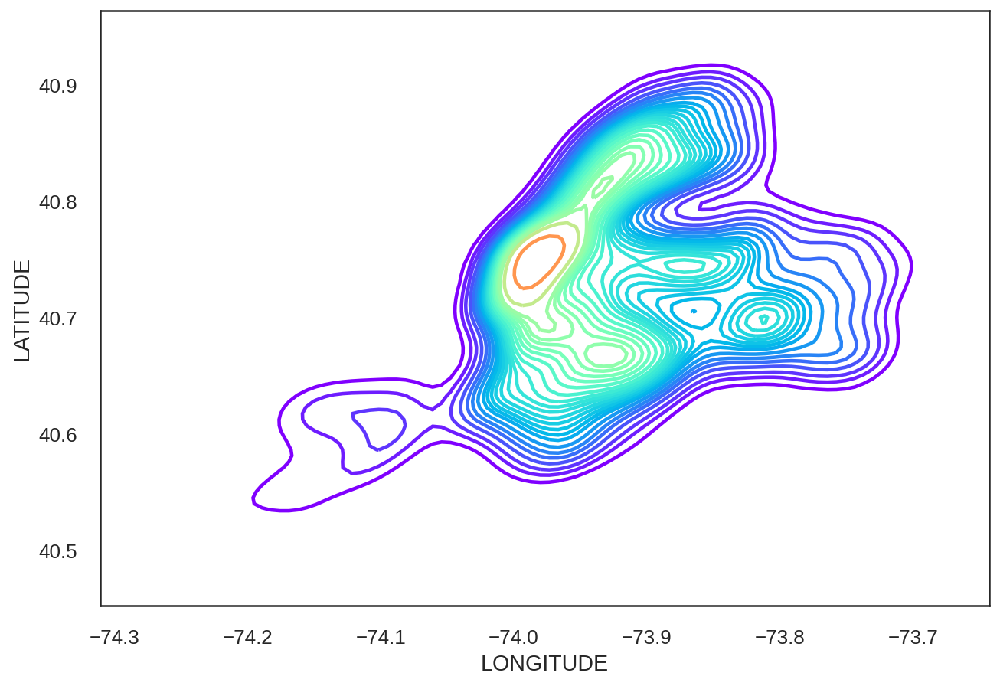

In [42]:

# We take a sample, because density plots take a long time to compute
# and a sample is typically as good as the full dataset
sample = df.sample(10000)

sns.kdeplot(
    data = sample,
    x = 'LONGITUDE',
    y = 'LATITUDE',
    gridsize=100,
    cmap='rainbow',
    shade=False,
    thresh=0.05,
    n_levels=25)

## Combining plots



So far, we examined how to create individual plots. We can even combine multiple plots together, using the `ax` parameter. (Historically, `ax` is the term used in MATLAB to refer to an individual plot.) So, let's say that we want to combine the scatter plots with the contour plot above:

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


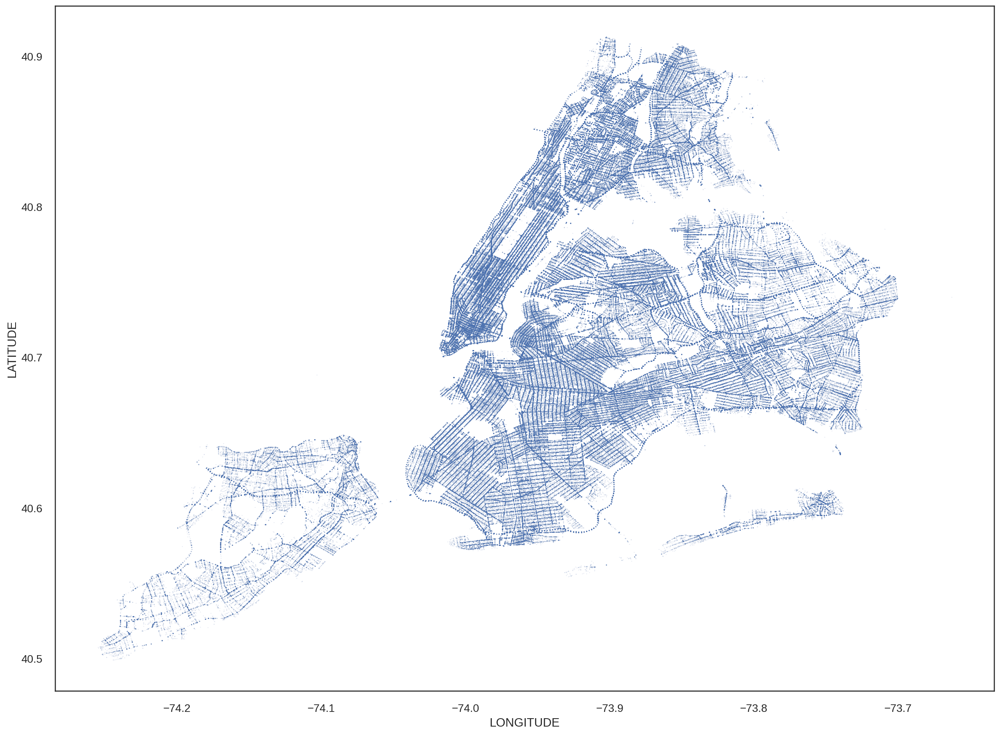

In [43]:
scatterplot = df.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.1)

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


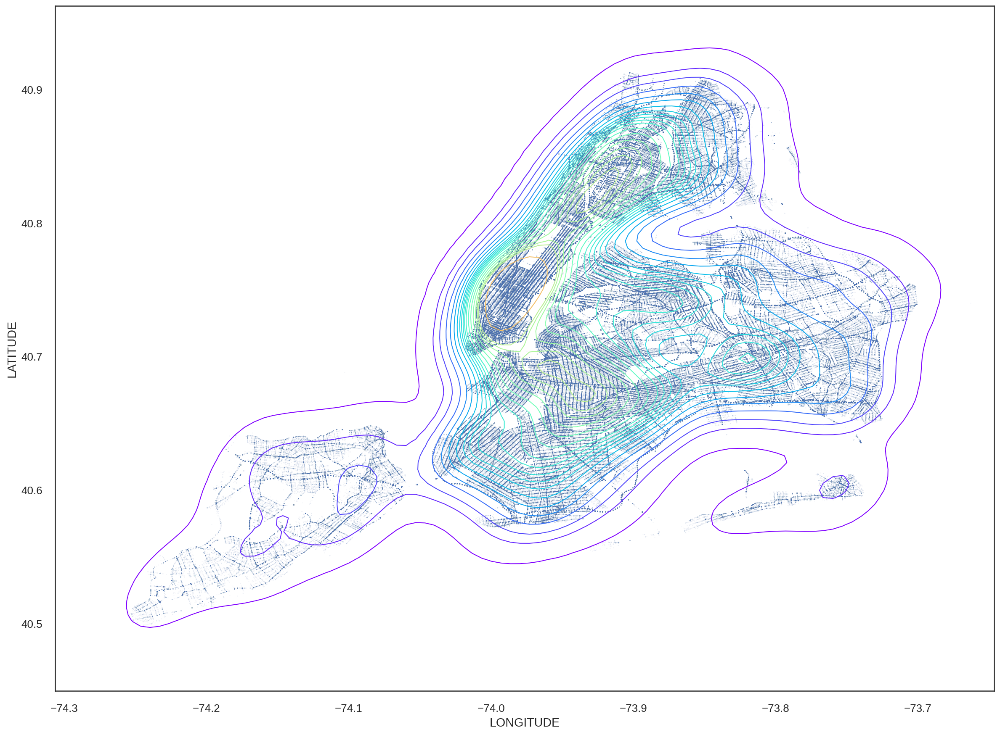

In [44]:
sample = df.sample(10000)

scatterplot = df.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.05)

sns.kdeplot(
    x=sample.LONGITUDE,
    y=sample.LATITUDE,
    gridsize=100,
    cmap=plt.cm.rainbow,
    shade=False,
    thresh=0.01,
    n_levels=20,
    alpha=1,
    linewidths=1,
    ax=scatterplot)

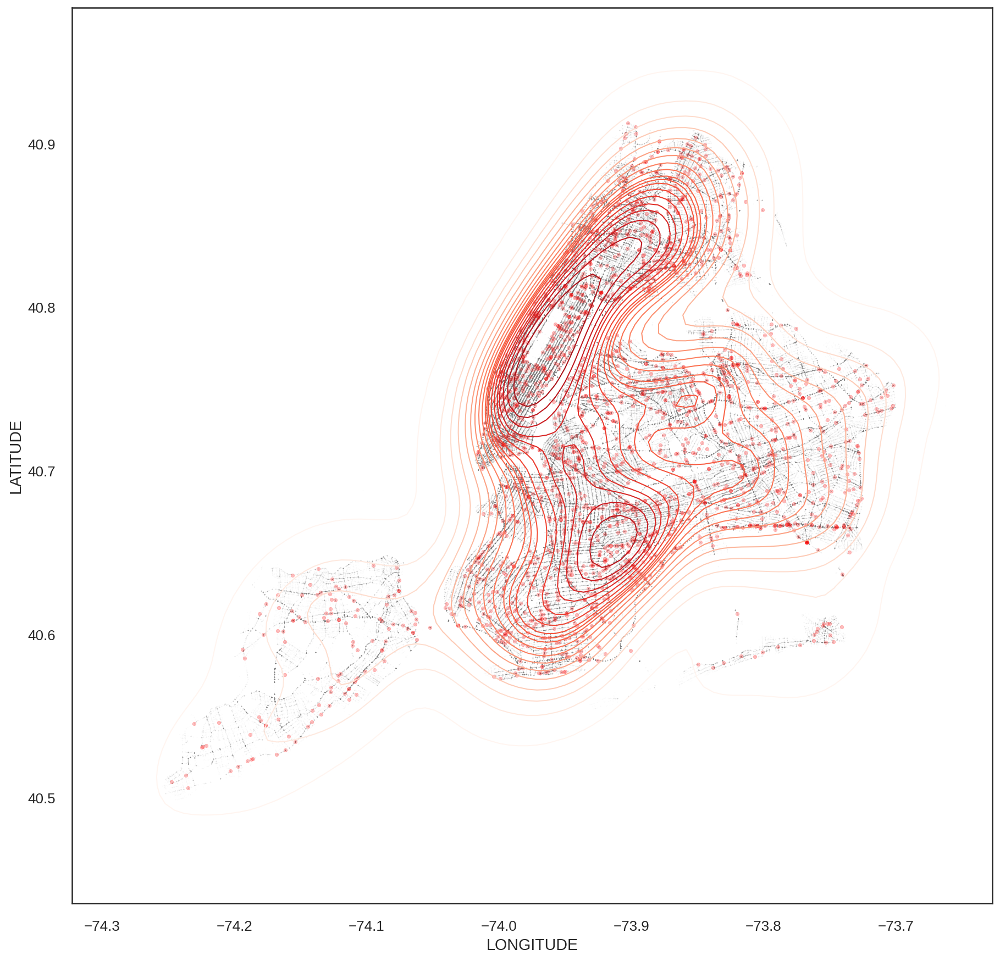

In [48]:
scatterplot = df.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(15, 15),
    color='gray',
    s=0.5,
    alpha=0.01)

deaths = df.query("DEATH==True").plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    color='red',
    s=10, alpha=0.25,
    ax=scatterplot
)

sns.kdeplot(
    data = df.query("DEATH==True"),
    x='LONGITUDE',
    y='LATITUDE',
    gridsize=100,
    cmap='Reds',
    shade=False,
    n_levels=20,
    thresh=0.01,
    alpha=1,
    # linestyles="--",
    linewidths=1,
    ax=deaths)

## Adding Geographic Boundaries

When dealing with spatial data, it is often useful to be able to add geographical details in our analysis. While we will not go in details here about the analysis of spatial data, let me mention the concept of **shapefiles**. Shapefiles are files that describe boundaries of geographical areas. Once we have a shapefile, we can then generate various spatial analyses but we will leave that discussion for another session. For now we will simply examine how to add some geographical detail in our plot.

The first step is to identify a shapefile for NYC. From the NYC Open data, we can get a shapefile of the NYC neighborhoods:

In [ ]:
# Dataset from NYC Open Data: https://data.cityofnewyork.us/City-Government/Neighborhood-Tabulation-Areas/cpf4-rkhq
df_nyc = gpd.GeoDataFrame.from_file('https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=Shapefile')

The file contains the name of each neighborhood, some other details, and a (set of) polygons that describe the shape of each neighborhood.

In [ ]:
df_nyc.head()

We can plot the polugons, using a standard plot command:

In [ ]:
df_nyc.plot(
    linewidth=0.5,
    color='White',
    edgecolor='Black',
    figsize=(20, 15),
    alpha=0.5)

Now let's combine the geo-plot with our earlier plots:

In [ ]:
base = df_nyc.plot(
    linewidth=0.5,
    color='White',
    edgecolor='Black',
    figsize=(20, 15),
    alpha=0.5)

scatterplot = cleandf.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.5,
    alpha=0.01,
    color='midnightblue',
    ax=base)

In [ ]:
# Limit only to accidents in Brooklyn and Queens
# acc_bq = cleandf[ (cleandf.BOROUGH == 'BROOKLYN') | (cleandf.BOROUGH == 'QUEENS')]

In [ ]:
base = df_nyc.plot(
    linewidth=0.5,
    color='White',
    edgecolor='Black',
    figsize=(20, 15),
    alpha=0.5)

scatterplot = cleandf.plot(
    kind='scatter',
    x='LONGITUDE',
    y='LATITUDE',
    figsize=(20, 15),
    s=0.25,
    alpha=0.02,
    color='midnightblue',
    ax=base)

sample = cleandf.sample(10000)

sns.kdeplot(
    x=sample.LONGITUDE,
    y=sample.LATITUDE,
    gridsize=200,
    n_levels=25,
    shade=True,
    alpha=0.4,
    cmap=plt.cm.rainbow,
    thresh=0.01,
    ax=scatterplot)

In [ ]:
## 

## Choropleths

In [ ]:
# Let's take a look at the "geo-dataframe" with the neighborhoods
df_nyc

In [ ]:
# We use the LAT/LON values to create a "geo" dataframe for the accidents
geo_coordinates = gpd.points_from_xy(cleandf.LONGITUDE, cleandf.LATITUDE)
accidents_geodf = gpd.GeoDataFrame(cleandf, geometry=geo_coordinates)

In [ ]:
# This is identical to the "cleandf" but it also has a "geometry" column at 
# the very right of the columns
accidents_geodf

In [ ]:
cols_to_keep = ['COLLISION_ID', 'geometry', 'INJURY', 'DEATH']
accidents_geodf = accidents_geodf[cols_to_keep]
accidents_geodf


In [ ]:
cols_to_keep = ['ntacode', 'boro_name', 'ntaname', 'geometry']
df_nyc = df_nyc[cols_to_keep]
df_nyc = df_nyc.set_index('ntacode')
df_nyc

In [ ]:
accidents_geodf.crs = df_nyc.crs
accidents_per_neighborhood = gpd.sjoin(df_nyc, accidents_geodf, how='inner', op='intersects')

In [ ]:
pivot = accidents_per_neighborhood.pivot_table(
   index = 'ntacode',
   values = 'COLLISION_ID',
   aggfunc = 'count'
) 

pivot

In [ ]:
pivot['count_percentile'] = pivot['COLLISION_ID'].rank(pct=True)
pivot

In [ ]:
aux_df = pd.merge(df_nyc, pivot, left_index=True, right_index=True)
aux_df


In [ ]:
ax = aux_df.plot(
    column = 'count_percentile',
    linewidth=0.25,
    edgecolor='Black',
    figsize=(20, 20),
    cmap = 'coolwarm',
    alpha=0.4)

ax.set_title("friendly_name")